# TRACKING CON OPENCV: DE LA TEORÍA A LA PRÁCTICA

In [ ]:
!pip uninstall opencv-contrib-python opencv-python opencv-contrib-python-headless && pip install opencv-contrib-python
!pip install opencv-contrib-python
!pip install ultralytics

Found existing installation: opencv-contrib-python 4.11.0.86
Uninstalling opencv-contrib-python-4.11.0.86:
  Would remove:
    /usr/local/lib/python3.11/dist-packages/cv2/*
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python-4.11.0.86.dist-info/*
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libQt5Core-e7f476e2.so.5.15.16
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libQt5Gui-1ce8cbfe.so.5.15.16
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libQt5Test-9ac3ed15.so.5.15.16
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libQt5Widgets-cd430389.so.5.15.16
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libQt5XcbQpa-b18b5a78.so.5.15.16
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libX11-xcb-0e257303.so.1.0.0
    /usr/local/lib/python3.11/dist-packages/opencv_contrib_python.libs/libXau-00ec42fe.so.6.0.0
    /usr/local/lib/python3.11

# Fundamentos Básicos de OpenCV

#### Lectura de Imágenes

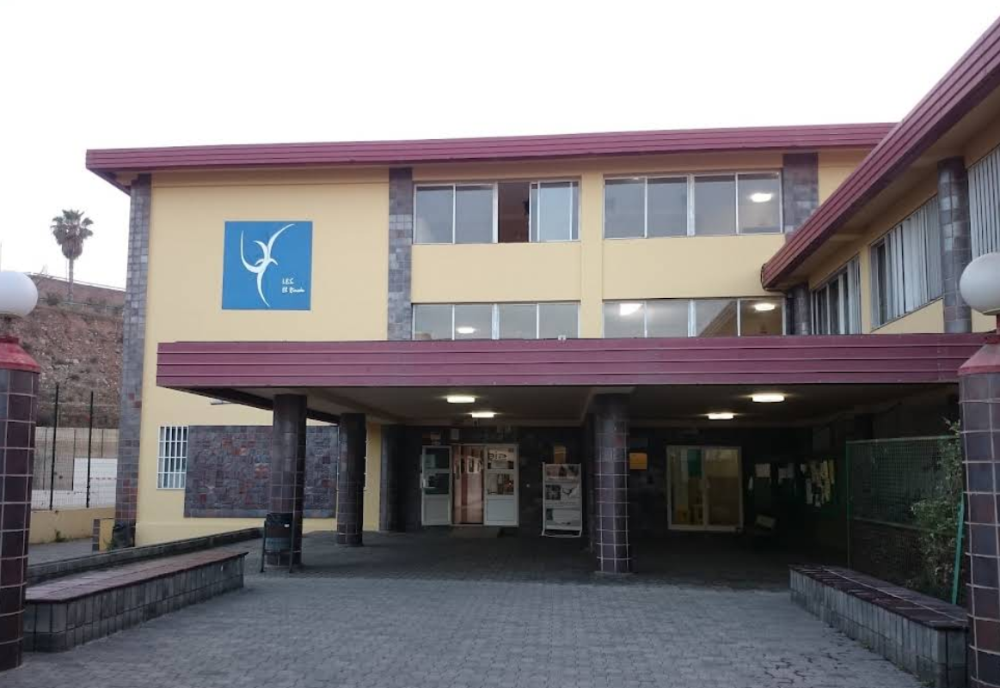

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-1-3235b5158939>", line 16, in <cell line: 0>
    k = input("Presiona 's' para guardar la imagen, cualquier otra tecla para salir: ")
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 1177, in raw_input
    return self._input_request(
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 1219, in _input_request
    raise KeyboardInterrupt("Interrupted by user") from None
KeyboardInterrupt: Interrupted by user

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 209

TypeError: object of type 'NoneType' has no len()

In [ ]:
import cv2 as cv
import numpy as np
import IPython.display as display
from PIL import Image

file = 'ies_el_rincon.png'
image = cv.imread(file)

if image is None:
    print("Error: No se pudo cargar la imagen.")
else:
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    img_pil = Image.fromarray(image_rgb)
    display.display(img_pil)

    k = input("Presiona 's' para guardar la imagen, cualquier otra tecla para salir: ")

    if k.lower() == 's':
        print('Guardamos la imagen')
        cv.imwrite('ies_el_rincon2.png', image)


#### Lectura de vídeo

In [ ]:
import cv2 as cv
import IPython.display as display
from PIL import Image
import time

video = cv.VideoCapture('times-square.mp4')

if not video.isOpened():
    print("Error: No se pudo abrir el video.")
else:
    try:
        while True:
            state, frame = video.read()
            if not state:
                break

            frame_rgb = cv.cvtColor(frame, cv.COLOR_BGR2RGB)
            img_pil = Image.fromarray(frame_rgb)

            display.clear_output(wait=True)
            display.display(img_pil)




    except KeyboardInterrupt:
        print("Interrupción del usuario.")

    finally:
        video.release()


Interrupción del usuario.




#### Lectura de webcam

In [ ]:
import cv2
import IPython.display as display
from PIL import Image
import numpy as np

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("No se pudo abrir la cámara.")
else:
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                print("No se pudo capturar el frame.")
                break

            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            img = Image.fromarray(frame)
            display.clear_output(wait=True)
            display.display(img)

    except KeyboardInterrupt:
        print("Interrupción del usuario.")

    finally:
        cap.release()
        cv2.destroyAllWindows()

Interrupción del usuario.


#### Crear imagen lisa

In [ ]:
import cv2 as cv
import numpy as np

# Crear una imagen de 500x500 píxeles con 3 canales (BGR) y color azul
image = np.full((500, 500, 3), (255, 0, 0), dtype=np.uint8)
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)
cv.destroyAllWindows()


### Dibujo de primitivas

#### Líneas

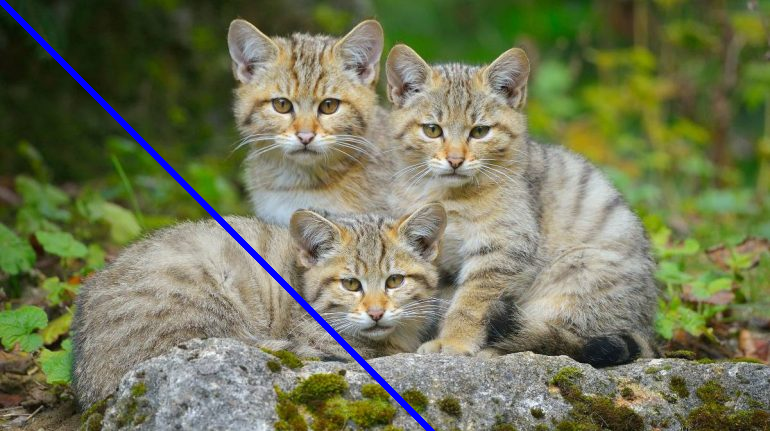

In [ ]:
image = cv.imread("cats.png")
cv.line(image,(0,0),(500,500),(255,0,0),5) # imagen, coordenada inicio, coordenada fin, color (Blue, Green, Red), grosor
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

#### Rectángulos

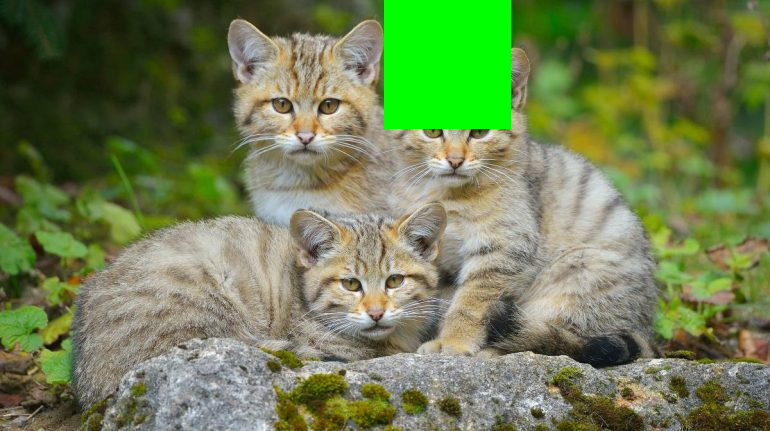

In [ ]:
image = cv.imread("cats.png")
cv.rectangle(image,(384,0),(510,128),(0,255,0),-1) # imagen, esquina superior izquierda, esquina inferior derecha, color (BGR), grosor (-1 == relleno)
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

#### Círculos

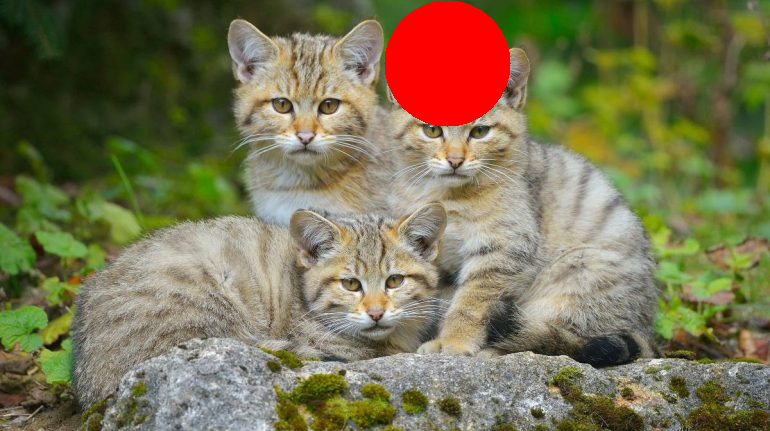

In [ ]:
image = cv.imread("cats.png")
cv.circle(image,(447,63), 63, (0,0,255), -1) # imagen, centro, radio, color (BGR), grosor
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

#### Elipsis

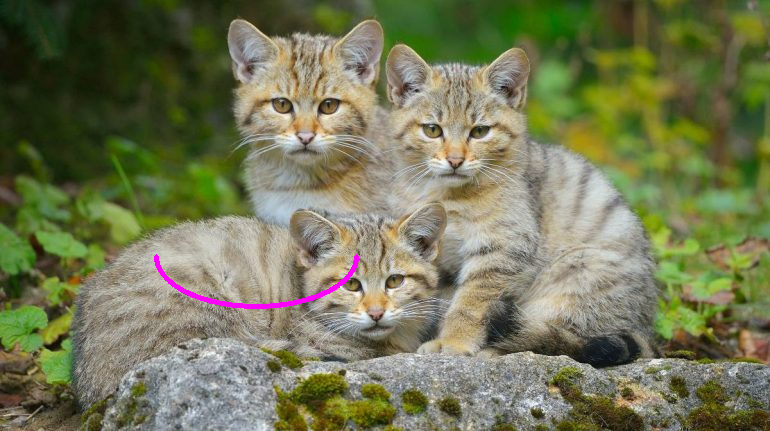

In [ ]:
image = cv.imread("cats.png")
cv.ellipse(image,(256,256),(100,50),0,0,180,(255,0, 255),4) # imagen, centro, (radio horizontal, radio vertical), ángulo de rotación, angulo inicio, angulo final, color, grosor
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

#### Texto

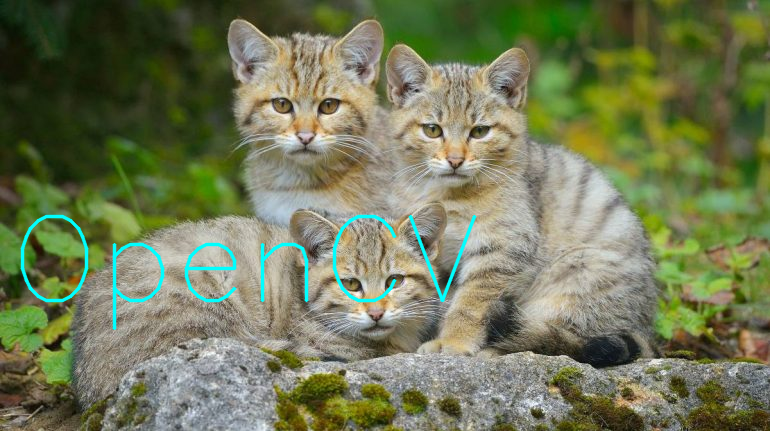

In [ ]:
image = cv.imread("cats.png")
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(image,'OpenCV',(10,300), font, 4,(255,255,0),2,cv.LINE_AA) # imagen, texto, inicio del texto, fin del texto, color (BGR), grosor
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

#### Poligonos

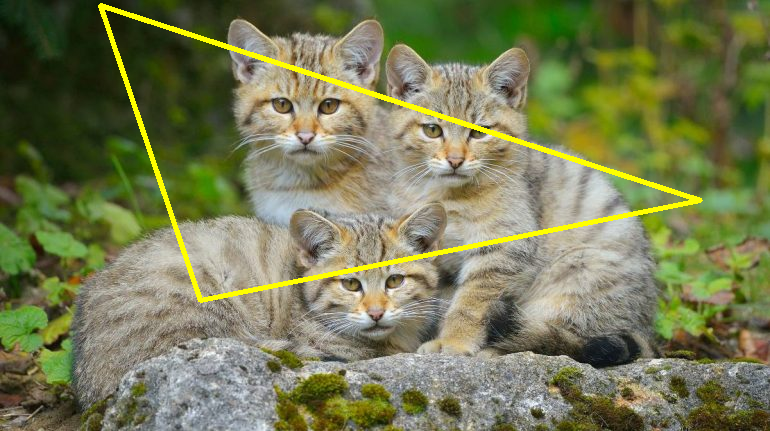

In [ ]:
image = cv.imread("cats.png")
pts = np.array([[100,5],[200,300],[700,200]], np.int32) # coordenadas de los puntos del polígono
pts = pts.reshape((-1,1,2))
cv.polylines(image,[pts],True,(0,255,255), 3)
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
img_pil = Image.fromarray(image_rgb)
display.display(img_pil)

# Actividades
- Crea una imagen negra de 500x500 píxeles y dibuja una línea diagonal blanca desde la esquina superior izquierda hasta la esquina inferior derecha.
- Dibuja un rectángulo rojo de 200x100 píxeles en el centro de una imagen de 600x400 píxeles. Usa cv.rectangle().
- Dibuja un círculo verde de radio 100 en el centro de una imagen de 500x500 píxeles. Luego, dibuja otro círculo concéntrico más pequeño con radio 50.
- Dibuja un triángulo azul en una imagen de 400x400 píxeles. Los vértices deben ser: (100, 300), (300, 300), (200, 100)
- Dibuja una elipse amarilla en una imagen de 600x600 píxeles. La elipse debe estar centrada en (300,300), tener ejes de (150, 100) y estar rotada 45°.
- Crea una imagen de 800x400 píxeles y escribe tu nombre en color blanco con la fuente cv.FONT_HERSHEY_SIMPLEX. El texto debe estar centrado.
- Dibuja un pentágono naranja dentro de una imagen de 500x500 píxeles. Define manualmente los cinco vértices y usa cv.polylines().
- Dibuja cuatro rectángulos de diferentes colores ocupando cada una de las esquinas de una imagen de 600x600 píxeles.

## Detección de objetos con YOLO y OpenCV

![YOLO](YOLO.gif)

La **detección de objetos** es una tarea de visión por computador que ayuda a detectar los objetos en una imagen o un fotograma de video. Permite reconocer los objetos, contar su frecuencia de aparición para llevar registros, entre otras aplicaciones. El objetivo de la detección de objetos es identificar y etiquetar cada uno de los objetos presentes en el medio.

**YOLO (You Only Look Once)** es un modelo de última generación que permite detectar objetos en una imagen o un video con una precisión y exactitud muy altas. En este tutorial, aprenderemos a ejecutar la detección de objetos con YOLO y a visualizar los fotogramas usando OpenCV, tanto en un video grabado como en una cámara en vivo.

#### Webcam

In [ ]:
import cv2
from ultralytics import YOLO
import IPython.display as display
from PIL import Image

yolo = YOLO('yolov9s.pt')
videoCap = cv2.VideoCapture(0)


def getColours(cls_num):
    base_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
    color_index = cls_num % len(base_colors)
    increments = [(1, -2, 1), (-2, 1, -1), (1, -1, 2)]
    color = [base_colors[color_index][i] + increments[color_index][i] *
    (cls_num // len(base_colors)) % 256 for i in range(3)]
    return tuple(color)


while True:
    ret, frame = videoCap.read()
    if not ret:
        continue
    results = yolo.track(frame, stream=True)


    for result in results:
        classes_names = result.names

        for box in result.boxes:
            if box.conf[0] > 0.4:
                [x1, y1, x2, y2] = box.xyxy[0]
                x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
                cls = int(box.cls[0])
                class_name = classes_names[cls]
                colour = getColours(cls)
                cv2.rectangle(frame, (x1, y1), (x2, y2), colour, 2)
                cv2.putText(frame, f'{classes_names[int(box.cls[0])]} {box.conf[0]:.2f}', (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 1, colour, 2)

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(frame)
    display.clear_output(wait=True)
    display.display(img)

videoCap.release()
cv2.destroyAllWindows()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 14.7M/14.7M [00:00<00:00, 55.0MB/s]


KeyboardInterrupt: 

# Actividad: Comparación de modelos
El objetivo de este ejercicio es probar distintos modelos YOLO en diferentes videos y analizar las diferencias en detección, precisión y velocidad.

'yolov8n.pt' |
'yolov8s.pt' |
'yolov8m.pt' |
'yolov8l.pt' |
'yolov8x.pt' |
'yolov9s.pt' |
'yolo-nas.pt'

Ejecuta el código y observa:

- ¿Qué modelo detecta mejor los objetos?
- ¿Qué modelo es más rápido?
- ¿Cómo afecta la precisión a la detección en cada video?


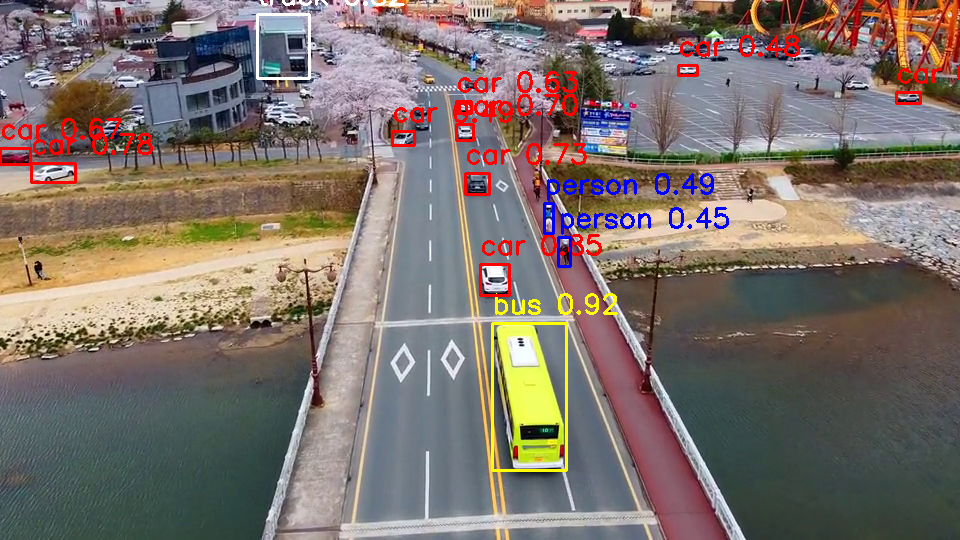


Interrupción del usuario
✅ Video procesado guardado en: outputYOLO.mp4


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image
import time


yolo = YOLO('yolov8l.pt')

video_input_file_name = "cherry.mp4"
videoCap = cv2.VideoCapture(video_input_file_name)

fps = int(videoCap.get(cv2.CAP_PROP_FPS))
width = int(videoCap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(videoCap.get(cv2.CAP_PROP_FRAME_HEIGHT))


output_path = 'outputYOLO.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))


def getColours(cls_num):
    base_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
    color_index = cls_num % len(base_colors)
    increments = [(1, -2, 1), (-2, 1, -1), (1, -1, 2)]
    color = [base_colors[color_index][i] + increments[color_index][i] *
             (cls_num // len(base_colors)) % 256 for i in range(3)]
    return tuple(color)

try:
    while videoCap.isOpened():
        ret, frame = videoCap.read()
        if not ret:
            break

        results = yolo.track(frame, stream=True)

        for result in results:
            classes_names = result.names
            for box in result.boxes:
                if box.conf[0] > 0.4:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])

                    cls = int(box.cls[0])
                    class_name = classes_names[cls]
                    colour = getColours(cls)

                    cv2.rectangle(frame, (x1, y1), (x2, y2), colour, 2)
                    cv2.putText(frame, f'{class_name} {box.conf[0]:.2f}',
                                (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, colour, 2)

        out.write(frame)

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        img_pil = Image.fromarray(frame_rgb)

        clear_output(wait=True)
        display(img_pil)


except KeyboardInterrupt:
    print("Interrupción del usuario")

finally:
    videoCap.release()
    out.release()
    print(f"✅ Video procesado guardado en: {output_path}")


# Tracking

El tracking de objetos es la técnica utilizada para seguir la trayectoria de un objeto a lo largo de varios frames en un video. A diferencia de la simple detección, que identifica objetos en cada frame de forma independiente, el tracking asocia objetos detectados en distintos frames, permitiendo mantener su identidad a lo largo del tiempo.

#### Seguimiento basado en centroides

Este código usa YOLOv8 para detectar objetos en cada frame y un método de tracking basado en asociación de centroides, que empareja detecciones de un frame con las del frame anterior en función de la distancia enre ellos (distancia euclidiana).

In [ ]:
import torch
import os
import numpy as np
import cv2 as cv
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

yolo = YOLO('yolov8s.pt').to(device)

video = cv.VideoCapture("people2.mp4")
status, img = video.read()
size = (img.shape[1], img.shape[0])

fourcc = cv.VideoWriter_fourcc(*'mp4v')
video_out = cv.VideoWriter('output_yolo2.mp4', fourcc, 20.0, size)

tracking = 255 * np.ones((img.shape[0], img.shape[1], 3))
means, labels, bbox = [], [], []


def compute_means(results):
    new_means, new_labels, new_bbox = [], [], []

    for result in results:
        if result.boxes is None:
            return [], [], []

        for box in result.boxes:
            if box.conf.item() > 0.5:   # umbral de confianza de la detección
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                new_means.append(((x1 + x2) / 2, (y1 + y2) / 2))
                new_bbox.append([x1, y1, x2, y2])
                new_labels.append(int(box.cls.item()))

    return new_means, new_labels, new_bbox


def distance(a, b):
    return (a[0] - b[0])**2 + (a[1] - b[1])**2


def match_objects(means, labels, bbox, new_means, new_labels, new_bbox):
    points, point_labels = [], []
    for i in range(len(new_means)):
        mean, label, box = new_means[i], new_labels[i], new_bbox[i]
        min_dist, min_pos, threshold = 9999, 9999, 200      # distancia minima, posición mínima, umbral de distancia
        for j in range(len(labels)):
            d = distance(mean, means[j][-1])
            if label == labels[j] and d < min_dist:
                min_dist, min_pos = d, j

        if min_dist > threshold:
            means.append([mean])
            labels.append(label)
            bbox.append([box])
        else:
            means[min_pos].append(mean)
            bbox[min_pos].append(box)
            points.append(mean)
            point_labels.append(label)

    return points, point_labels


def draw_points(tracking, points):
    for point in points:
        x, y = int(point[0]), int(point[1])
        cv.circle(tracking, (x, y), 3, (0, 0, 255), -1)


def draw_bbox(results, image):
    for result in results:
        for box in result.boxes:
            if box.conf.item() > 0.5:
                x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                cv.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv.putText(image, f"Conf: {box.conf.item():.2f}", (x1, y1 - 10),
                           cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

try:
    while status:
        orig = img.copy()
        results = yolo(img)
        new_means, new_labels, new_bbox = compute_means(results)
        points, point_labels = match_objects(means, labels, bbox, new_means, new_labels, new_bbox)
        draw_points(tracking, points)
        img_detections = draw_bbox(results, orig)
        output = img_detections & tracking.astype(np.uint8)
        frame_rgb = cv.cvtColor(output, cv.COLOR_BGR2RGB)
        img_pil = Image.fromarray(frame_rgb)

        clear_output(wait=True)
        display(img_pil)

        video_out.write(output)

        status, img = video.read()

except KeyboardInterrupt:
    print("Interrupción del usuario")

finally:
    video.release()
    video_out.release()
    print(f"✅ Video procesado guardado en: output_yolo.mp4")


Using cuda device
Interrupción del usuario
✅ Video procesado guardado en: output_yolo.mp4


## **Tarea 1:** Modificar los umbrales de confianza en la detección y el umbral de distancia en el tracking para analizar cómo afectan el rendimiento del sistema.
Confianza mínima de detección (conf_threshold): Se usa para filtrar detecciones con baja probabilidad de ser correctas. 0.3, 0.6 y 0.9
Umbral de distancia (match_threshold): Se usa para asociar los objetos detectados en un frame con los de frames anteriores. Prueben con valores como 100, 300 y 500.

 - ¿Cómo cambia la cantidad de objetos detectados al modificar la confianza?
 - ¿Cómo afecta el tracking si el umbral es muy bajo o muy alto?


## **Tarea 2:** Dada la posición inicial de un objeto, trackea la posición en los frames consecutivos

![Object Tracking](https://learnopencv.com/wp-content/uploads/2023/03/opencv_bootcamp_NB11_race_car_tracking.png)

In [1]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import HTML
from matplotlib.animation import FuncAnimation

from IPython.display import YouTubeVideo, display, HTML
from base64 import b64encode

%matplotlib inline

## Descargar las configuraciones

In [2]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assests....", end="")

    urlretrieve(url, save_path)

    try:
        with ZipFile(save_path) as z:
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)

In [3]:
URL = r"https://www.dropbox.com/s/ld535c8e0vueq6x/opencv_bootcamp_assets_NB11.zip?dl=1"

asset_zip_path = os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB11.zip")

# Download if assest ZIP does not exists.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

## Trackers incorporados en OpenCV

1. BOOSTING
2. MIL
3. KCF
4. CRST
5. TLD
6. MEDIANFLOW
7. GOTURN
8. MOSSE
9. CAMSHIFT
10. SURF
11. SIFT

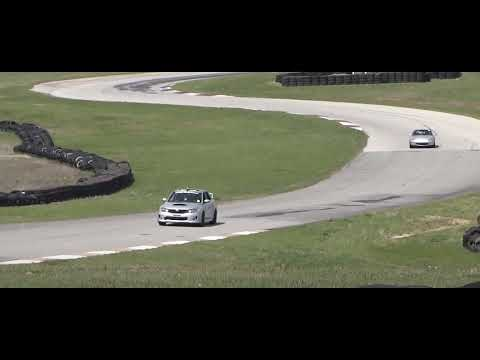

In [4]:
video = YouTubeVideo("XkJCvtCRdVM", width=1024, height=640)
display(video)

In [5]:
video_input_file_name = "race_car.mp4"


def drawRectangle(frame, bbox):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, (255, 0, 0), 2, 1)


def displayRectangle(frame, bbox):
    plt.figure(figsize=(20, 10))
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox)
    frameCopy = cv2.cvtColor(frameCopy, cv2.COLOR_RGB2BGR)
    plt.imshow(frameCopy)
    plt.axis("off")


def drawText(frame, txt, location, color=(50, 170, 50)):
    cv2.putText(frame, txt, location, cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

## Crear la instancia de tracking

In [6]:
# Set up tracker
tracker_types = [
    "BOOSTING",
    "MIL",
    "KCF",
    "CSRT",
    "TLD",
    "MEDIANFLOW",
    "GOTURN",
    "MOSSE",
]

tracker_type = tracker_types[4] # Cambia el tracker

if tracker_type == "BOOSTING":
    tracker = cv2.legacy.TrackerBoosting.create()
elif tracker_type == "MIL":
    tracker = cv2.legacy.TrackerMIL.create()
elif tracker_type == "KCF":
    tracker = cv2.TrackerKCF.create()
elif tracker_type == "CSRT":
    tracker = cv2.TrackerCSRT.create()
elif tracker_type == "TLD":
    tracker = cv2.legacy.TrackerTLD.create()
elif tracker_type == "MEDIANFLOW":
    tracker = cv2.legacy.TrackerMedianFlow.create()
elif tracker_type == "GOTURN":
    tracker = cv2.TrackerGOTURN.create()
else:
    tracker = cv2.legacy.TrackerMOSSE.create()

In [7]:
video = cv2.VideoCapture(video_input_file_name)
ok, frame = video.read()

if not video.isOpened():
    print("Could not open video")
    sys.exit()
else:
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_output_file_name = "race_car-" + tracker_type + ".mp4"
video_out = cv2.VideoWriter(video_output_file_name, cv2.VideoWriter_fourcc(*"XVID"), 10, (width, height))

video_output_file_name

'race_car-TLD.mp4'

## Define Bounding Box

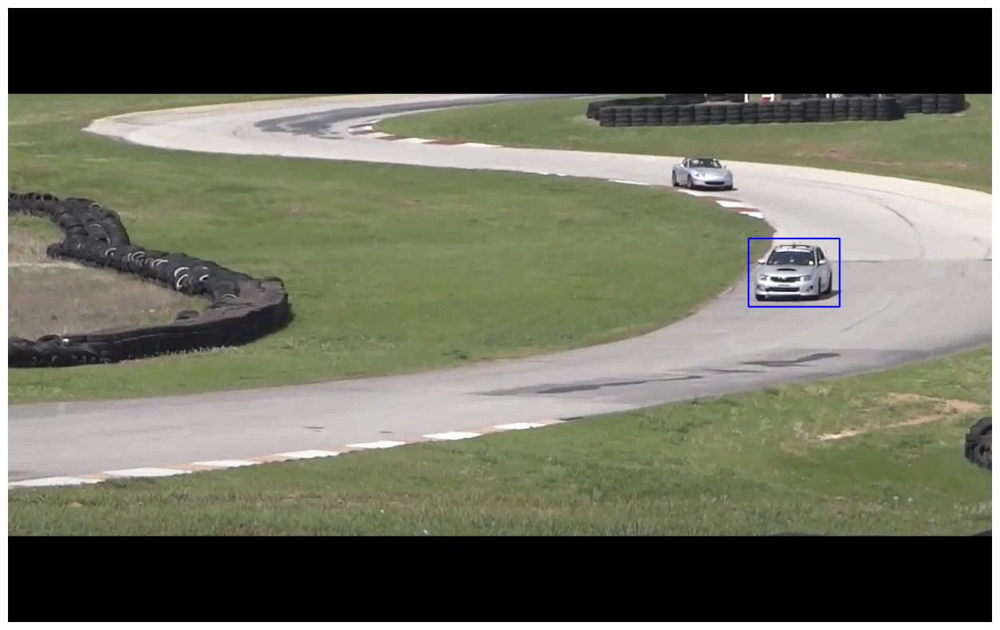

In [8]:
# Define a bounding box
bbox = (1300, 405, 160, 120)
# bbox = cv2.selectROI(frame, False)
# print(bbox)
displayRectangle(frame, bbox)

## Initializar el Tracker

In [9]:
ok = tracker.init(frame, bbox)

## Leer frame y seguir objeto

In [10]:
while True:
    ok, frame = video.read()

    if not ok:
        break

    timer = cv2.getTickCount()

    ok, bbox = tracker.update(frame)

    fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)

    if ok:
        drawRectangle(frame, bbox)
    else:
        drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

    drawText(frame, tracker_type + " Tracker", (80, 60))
    drawText(frame, "FPS : " + str(int(fps)), (80, 100))

    video_out.write(frame)

video.release()
video_out.release()

#### Convertir video para renderizado MP4

In [ ]:
!apt-get -qq install ffmpeg

!ffmpeg -y -i {video_output_file_name} -c:v libx264 $"race_car_track_x264.mp4"  -hide_banner -loglevel error # Cambiar nombre del video

## Renderiza el video MP4

In [ ]:
mp4 = open("/content/race_car_track_x264.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""<video width=1024 controls><source src="{data_url}" type="video/mp4"></video>""")